In [38]:
# time series library import
import os
import datetime
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import plotly.express as px
from statsmodels.tsa.seasonal import seasonal_decompose

In [4]:
# managing figure size in the begining of the code
mpl.rcParams['figure.figsize'] = (15,6)
mpl.rcParams['axes.grid'] = False

In [5]:
#import the dataset
zip_path = tf.keras.utils.get_file(
    origin = 'https://storage.googleapis.com/tensorflow/tf-keras-datasets/jena_climate_2009_2016.csv.zip', 
    fname = 'jena_climate_2009_2016.csv.zip',
    extract = True)
csv_path,_ = os.path.splitext(zip_path)

In [6]:
# read the data in pandas dataframe
df = pd.read_csv(csv_path)
df.head()

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,265.40,-8.90,93.3,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.3
1,01.01.2009 00:20:00,996.57,-8.41,265.01,-9.28,93.4,3.23,3.02,0.21,1.89,3.03,1309.80,0.72,1.50,136.1
2,01.01.2009 00:30:00,996.53,-8.51,264.91,-9.31,93.9,3.21,3.01,0.20,1.88,3.02,1310.24,0.19,0.63,171.6
3,01.01.2009 00:40:00,996.51,-8.31,265.12,-9.07,94.2,3.26,3.07,0.19,1.92,3.08,1309.19,0.34,0.50,198.0
4,01.01.2009 00:50:00,996.51,-8.27,265.15,-9.04,94.1,3.27,3.08,0.19,1.92,3.09,1309.00,0.32,0.63,214.3


In [7]:
# read the data in pandas dataframe
df = pd.read_csv(csv_path)
# write the csv file 
df.to_csv('jena_climate_2009_2016.csv')

In [8]:
df.head()

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,265.40,-8.90,93.3,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.3
1,01.01.2009 00:20:00,996.57,-8.41,265.01,-9.28,93.4,3.23,3.02,0.21,1.89,3.03,1309.80,0.72,1.50,136.1
2,01.01.2009 00:30:00,996.53,-8.51,264.91,-9.31,93.9,3.21,3.01,0.20,1.88,3.02,1310.24,0.19,0.63,171.6
3,01.01.2009 00:40:00,996.51,-8.31,265.12,-9.07,94.2,3.26,3.07,0.19,1.92,3.08,1309.19,0.34,0.50,198.0
4,01.01.2009 00:50:00,996.51,-8.27,265.15,-9.04,94.1,3.27,3.08,0.19,1.92,3.09,1309.00,0.32,0.63,214.3


In [9]:
df.shape

(420551, 15)

In [10]:
420551*15

6308265

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420551 entries, 0 to 420550
Data columns (total 15 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   Date Time        420551 non-null  object 
 1   p (mbar)         420551 non-null  float64
 2   T (degC)         420551 non-null  float64
 3   Tpot (K)         420551 non-null  float64
 4   Tdew (degC)      420551 non-null  float64
 5   rh (%)           420551 non-null  float64
 6   VPmax (mbar)     420551 non-null  float64
 7   VPact (mbar)     420551 non-null  float64
 8   VPdef (mbar)     420551 non-null  float64
 9   sh (g/kg)        420551 non-null  float64
 10  H2OC (mmol/mol)  420551 non-null  float64
 11  rho (g/m**3)     420551 non-null  float64
 12  wv (m/s)         420551 non-null  float64
 13  max. wv (m/s)    420551 non-null  float64
 14  wd (deg)         420551 non-null  float64
dtypes: float64(14), object(1)
memory usage: 48.1+ MB


In [12]:
df.describe()

,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
count,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000
mean,989.212776,9.450147,283.492743,4.955854,76.008259,13.576251,9.533756,4.042412,6.022408,9.640223,1216.062748,1.702224,3.056555,174.743738
std,8.358481,8.423365,8.504471,6.730674,16.476175,7.739020,4.184164,4.896851,2.656139,4.235395,39.975208,65.446714,69.016932,86.681693
min,913.600000,-23.010000,250.600000,-25.010000,12.950000,0.950000,0.790000,0.000000,0.500000,0.800000,1059.450000,-9999.000000,-9999.000000,0.000000
25%,984.200000,3.360000,277.430000,0.240000,65.210000,7.780000,6.210000,0.870000,3.920000,6.290000,1187.490000,0.990000,1.760000,124.900000
50%,989.580000,9.420000,283.470000,5.220000,79.300000,11.820000,8.860000,2.190000,5.590000,8.960000,1213.790000,1.760000,2.960000,198.100000
75%,994.720000,15.470000,289.530000,10.070000,89.400000,17.600000,12.350000,5.300000,7.800000,12.490000,1242.770000,2.860000,4.740000,234.100000
max,1015.350000,37.280000,311.340000,23.110000,100.000000,63.770000,28.320000,46.010000,18.130000,28.820000,1393.540000,28.490000,23.500000,360.000000


In [13]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
p (mbar),420551.0,989.212776,8.358481,913.60,984.20,989.58,994.72,1015.35
T (degC),420551.0,9.450147,8.423365,-23.01,3.36,9.42,15.47,37.28
Tpot (K),420551.0,283.492743,8.504471,250.60,277.43,283.47,289.53,311.34
Tdew (degC),420551.0,4.955854,6.730674,-25.01,0.24,5.22,10.07,23.11
rh (%),420551.0,76.008259,16.476175,12.95,65.21,79.30,89.40,100.00
VPmax (mbar),420551.0,13.576251,7.739020,0.95,7.78,11.82,17.60,63.77
VPact (mbar),420551.0,9.533756,4.184164,0.79,6.21,8.86,12.35,28.32
VPdef (mbar),420551.0,4.042412,4.896851,0.00,0.87,2.19,5.30,46.01
sh (g/kg),420551.0,6.022408,2.656139,0.50,3.92,5.59,7.80,18.13
H2OC (mmol/mol),420551.0,9.640223,4.235395,0.80,6.29,8.96,12.49,28.82


In [14]:
df.head(100)

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,265.40,-8.90,93.3,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.3
1,01.01.2009 00:20:00,996.57,-8.41,265.01,-9.28,93.4,3.23,3.02,0.21,1.89,3.03,1309.80,0.72,1.50,136.1
2,01.01.2009 00:30:00,996.53,-8.51,264.91,-9.31,93.9,3.21,3.01,0.20,1.88,3.02,1310.24,0.19,0.63,171.6
3,01.01.2009 00:40:00,996.51,-8.31,265.12,-9.07,94.2,3.26,3.07,0.19,1.92,3.08,1309.19,0.34,0.50,198.0
4,01.01.2009 00:50:00,996.51,-8.27,265.15,-9.04,94.1,3.27,3.08,0.19,1.92,3.09,1309.00,0.32,0.63,214.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,01.01.2009 16:00:00,999.94,-5.40,267.76,-6.86,89.4,4.08,3.65,0.43,2.27,3.65,1299.17,1.40,2.13,145.5
96,01.01.2009 16:10:00,1000.05,-5.31,267.85,-6.69,89.9,4.11,3.69,0.42,2.30,3.69,1298.81,1.03,1.50,127.0
97,01.01.2009 16:20:00,1000.05,-5.28,267.88,-6.68,89.8,4.12,3.70,0.42,2.30,3.70,1298.69,1.11,1.88,134.7
98,01.01.2009 16:30:00,1000.10,-5.32,267.83,-6.77,89.5,4.11,3.67,0.43,2.29,3.67,1298.96,1.35,2.13,132.3


In [15]:
df.tail(100)

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
420451,31.12.2016 07:30:00,1006.34,-6.26,266.42,-9.32,78.70,3.82,3.01,0.81,1.86,2.99,1311.97,1.20,1.68,163.9
420452,31.12.2016 07:40:00,1006.26,-6.35,266.33,-8.62,83.80,3.79,3.18,0.61,1.97,3.16,1312.27,0.60,1.16,145.7
420453,31.12.2016 07:50:00,1006.29,-6.46,266.22,-8.80,83.30,3.76,3.13,0.63,1.94,3.11,1312.85,0.50,1.04,184.1
420454,31.12.2016 08:00:00,1006.28,-6.80,265.89,-8.85,85.20,3.67,3.12,0.54,1.93,3.10,1314.51,0.74,1.76,178.1
420455,31.12.2016 08:10:00,1006.22,-6.84,265.85,-8.71,86.40,3.65,3.16,0.50,1.95,3.14,1314.62,0.95,1.90,181.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
420546,31.12.2016 23:20:00,1000.07,-4.05,269.10,-8.13,73.10,4.52,3.30,1.22,2.06,3.30,1292.98,0.67,1.52,240.0
420547,31.12.2016 23:30:00,999.93,-3.35,269.81,-8.06,69.71,4.77,3.32,1.44,2.07,3.32,1289.44,1.14,1.92,234.3
420548,31.12.2016 23:40:00,999.82,-3.16,270.01,-8.21,67.91,4.84,3.28,1.55,2.05,3.28,1288.39,1.08,2.00,215.2
420549,31.12.2016 23:50:00,999.81,-4.23,268.94,-8.53,71.80,4.46,3.20,1.26,1.99,3.20,1293.56,1.49,2.16,225.8


In [16]:
# print all the columns
pd.set_option('display.max_rows', None)
df.head(20)

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,265.40,-8.90,93.3,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.3
1,01.01.2009 00:20:00,996.57,-8.41,265.01,-9.28,93.4,3.23,3.02,0.21,1.89,3.03,1309.80,0.72,1.50,136.1
2,01.01.2009 00:30:00,996.53,-8.51,264.91,-9.31,93.9,3.21,3.01,0.20,1.88,3.02,1310.24,0.19,0.63,171.6
3,01.01.2009 00:40:00,996.51,-8.31,265.12,-9.07,94.2,3.26,3.07,0.19,1.92,3.08,1309.19,0.34,0.50,198.0
4,01.01.2009 00:50:00,996.51,-8.27,265.15,-9.04,94.1,3.27,3.08,0.19,1.92,3.09,1309.00,0.32,0.63,214.3
5,01.01.2009 01:00:00,996.50,-8.05,265.38,-8.78,94.4,3.33,3.14,0.19,1.96,3.15,1307.86,0.21,0.63,192.7
6,01.01.2009 01:10:00,996.50,-7.62,265.81,-8.30,94.8,3.44,3.26,0.18,2.04,3.27,1305.68,0.18,0.63,166.5
7,01.01.2009 01:20:00,996.50,-7.62,265.81,-8.36,94.4,3.44,3.25,0.19,2.03,3.26,1305.69,0.19,0.50,118.6
8,01.01.2009 01:30:00,996.50,-7.91,265.52,-8.73,93.8,3.36,3.15,0.21,1.97,3.16,1307.17,0.28,0.75,188.5
9,01.01.2009 01:40:00,996.53,-8.43,264.99,-9.34,93.1,3.23,3.00,0.22,1.88,3.02,1309.85,0.59,0.88,185.0


In [17]:
# select the data based on the Date Time column for every 30 minutes interval 
# Slice [start: stop: step], starting from index 11 take every 12th record.
df= df[11::12]
df.head(10)

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
11,01.01.2009 02:00:00,996.62,-8.88,264.54,-9.77,93.2,3.12,2.90,0.21,1.81,2.91,1312.25,0.25,0.63,190.3
23,01.01.2009 04:00:00,996.99,-9.05,264.34,-10.02,92.6,3.07,2.85,0.23,1.78,2.85,1313.61,0.10,0.38,240.0
35,01.01.2009 06:00:00,997.71,-9.67,263.66,-10.62,92.7,2.93,2.71,0.21,1.69,2.72,1317.71,0.05,0.50,146.0
47,01.01.2009 08:00:00,999.17,-8.10,265.12,-9.05,92.8,3.31,3.07,0.24,1.92,3.08,1311.65,0.72,1.25,213.9
59,01.01.2009 10:00:00,1000.27,-7.04,266.10,-8.17,91.6,3.60,3.30,0.30,2.05,3.29,1307.76,1.45,3.00,292.6
71,01.01.2009 12:00:00,1000.30,-6.87,266.27,-8.28,89.6,3.64,3.27,0.38,2.03,3.26,1306.98,1.84,2.63,184.4
83,01.01.2009 14:00:00,999.81,-5.94,267.24,-7.43,89.1,3.92,3.49,0.43,2.17,3.49,1301.67,1.25,2.00,144.0
95,01.01.2009 16:00:00,999.94,-5.40,267.76,-6.86,89.4,4.08,3.65,0.43,2.27,3.65,1299.17,1.40,2.13,145.5
107,01.01.2009 18:00:00,1000.16,-5.25,267.90,-6.75,89.1,4.13,3.68,0.45,2.29,3.68,1298.68,0.55,1.00,183.7
119,01.01.2009 20:00:00,1000.22,-4.90,268.24,-6.38,89.3,4.24,3.79,0.45,2.36,3.78,1297.05,0.68,1.13,195.2


In [18]:
df.shape

(35045, 15)

In [19]:
date_time = pd.to_datetime(df.pop('Date Time'), format='%d.%m.%Y %H:%M:%S')

In [20]:
df.head()

,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
11,996.62,-8.88,264.54,-9.77,93.2,3.12,2.90,0.21,1.81,2.91,1312.25,0.25,0.63,190.3
23,996.99,-9.05,264.34,-10.02,92.6,3.07,2.85,0.23,1.78,2.85,1313.61,0.10,0.38,240.0
35,997.71,-9.67,263.66,-10.62,92.7,2.93,2.71,0.21,1.69,2.72,1317.71,0.05,0.50,146.0
47,999.17,-8.10,265.12,-9.05,92.8,3.31,3.07,0.24,1.92,3.08,1311.65,0.72,1.25,213.9
59,1000.27,-7.04,266.10,-8.17,91.6,3.60,3.30,0.30,2.05,3.29,1307.76,1.45,3.00,292.6


In [21]:
df.columns

Index(['p (mbar)', 'T (degC)', 'Tpot (K)', 'Tdew (degC)', 'rh (%)',
       'VPmax (mbar)', 'VPact (mbar)', 'VPdef (mbar)', 'sh (g/kg)',
       'H2OC (mmol/mol)', 'rho (g/m**3)', 'wv (m/s)', 'max. wv (m/s)',
       'wd (deg)'],
      dtype='object')

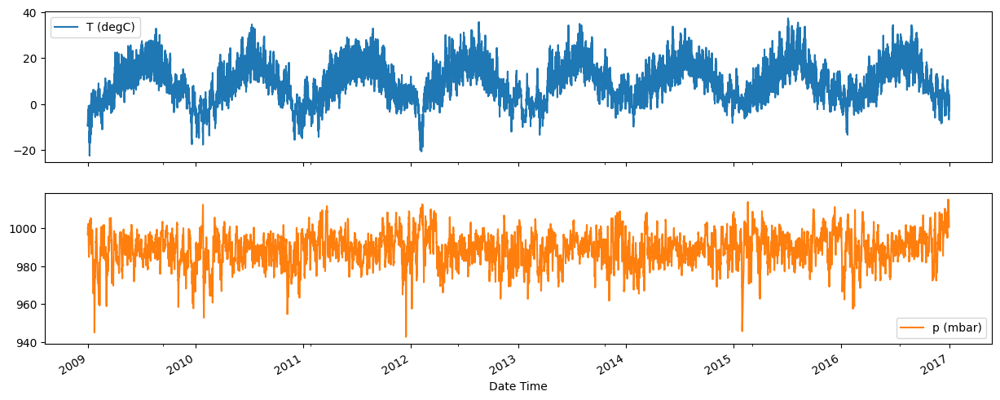

In [22]:
# let's plot the data
plot_cols = ['T (degC)', 'p (mbar)']
plot_features= df [plot_cols]
plot_features.index = date_time
_ = plot_features.plot(subplots=True)

In [23]:
#lets plot the same plots in plotly
fig = px.line(df, x=date_time, y=plot_cols)
fig.show()

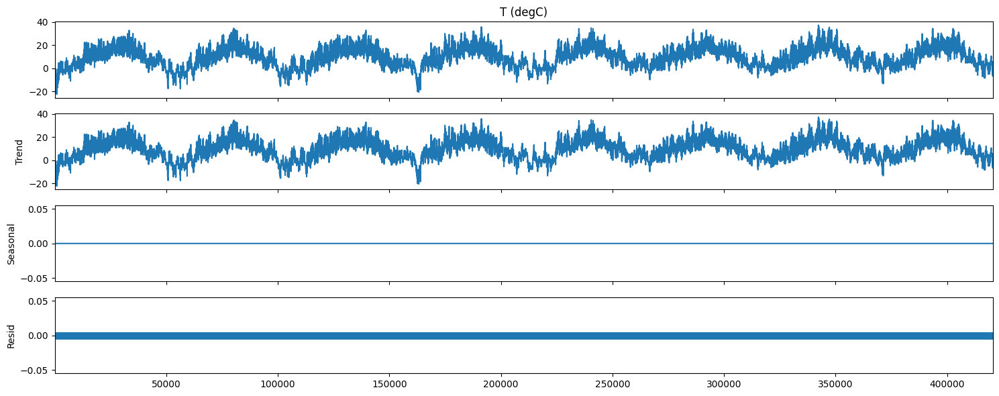

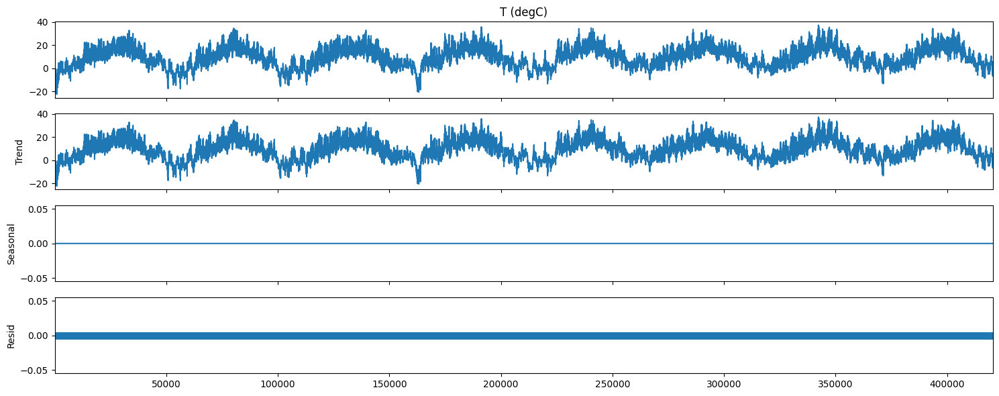

In [39]:
#lets decompose the data into trend, seasonality and noise
# we will use the seasonal decompose function from statsmodels library 
decompose = seasonal_decompose (df['T (degC)'], model='additive', period=1)
decompose.plot()

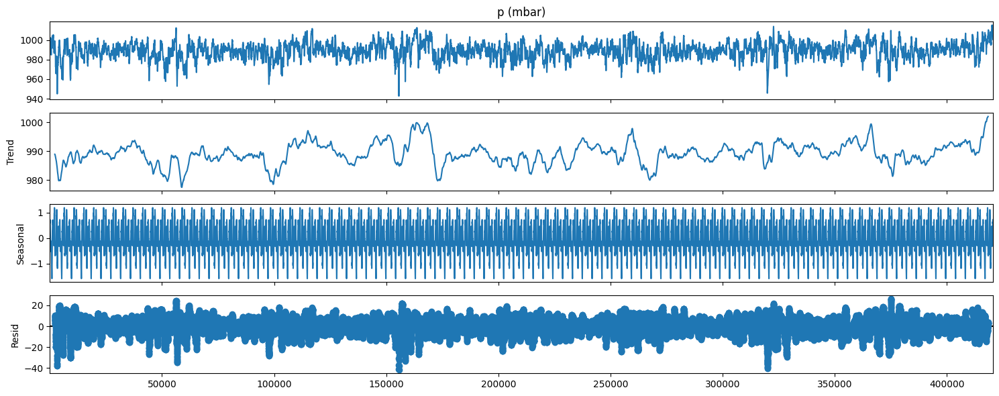

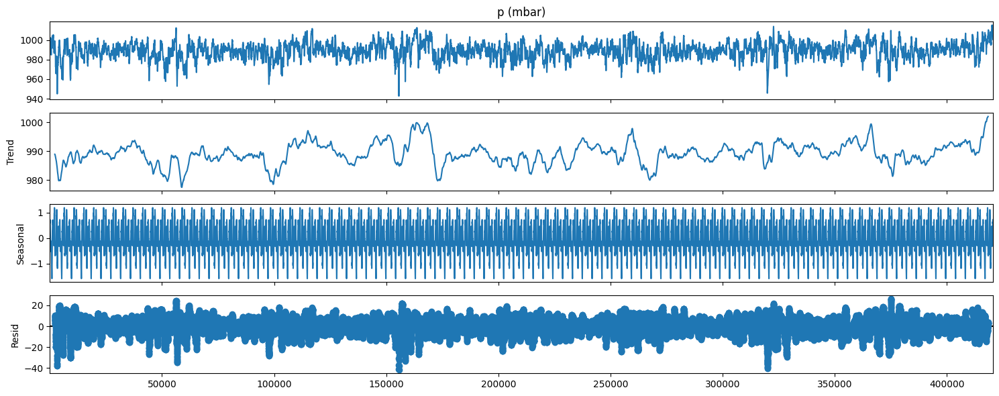

In [42]:
decompose = seasonal_decompose (df['p (mbar)'], model='additive', period=365)
decompose.plot()

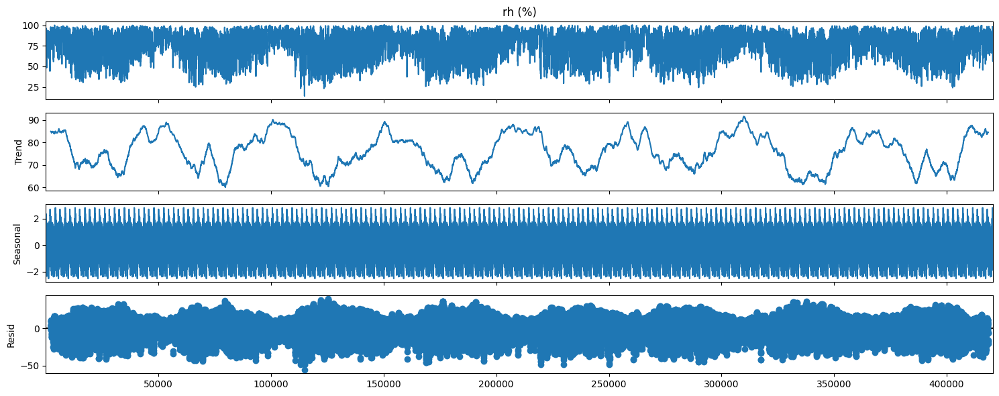

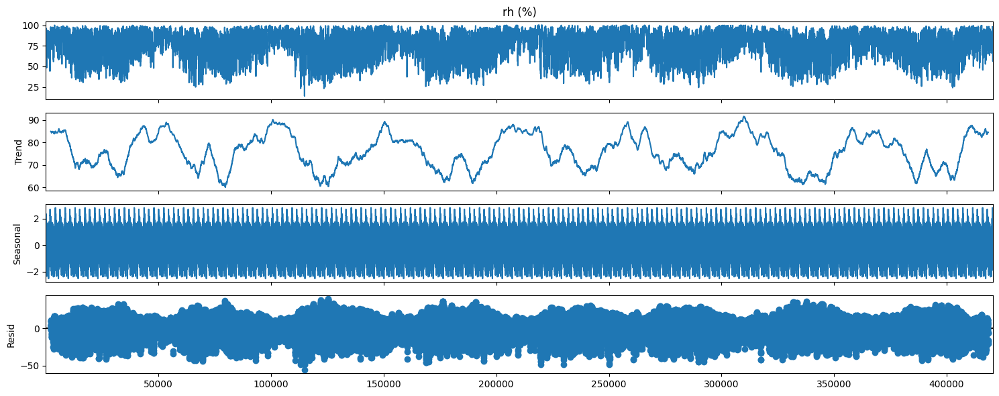

In [43]:
decompose = seasonal_decompose (df['rh (%)'], model='additive', period=365)
decompose.plot()

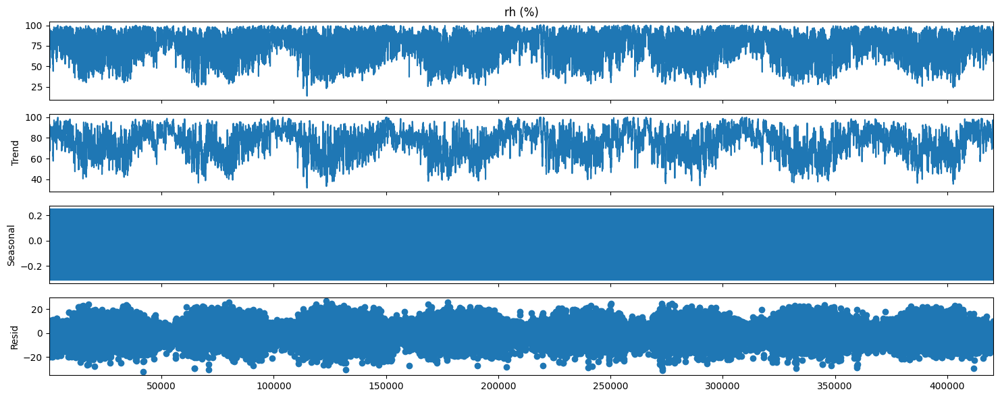

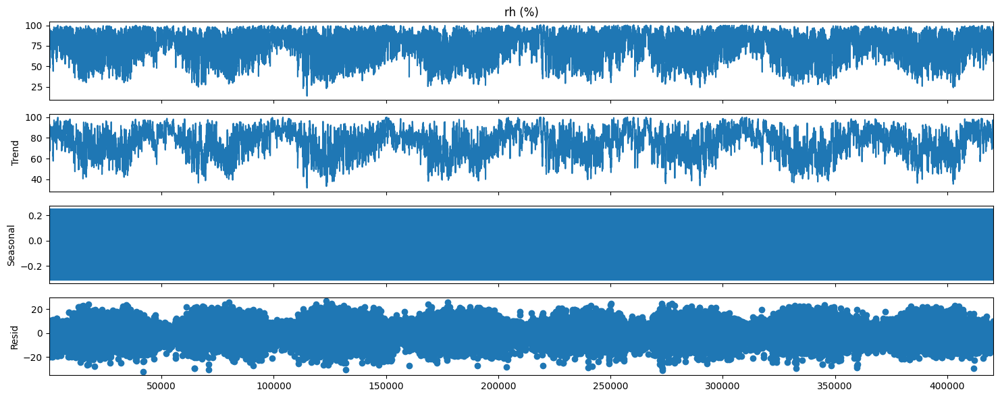

In [44]:
decompose = seasonal_decompose (df['rh (%)'], model='additive', period=8)
decompose.plot()

In [29]:
# lets plot the same plots in plotly
fig = px.line (df, x=date_time, y='T (degC)')
fig.show()
fig = px. line (df, x=date_time, y='p (mbar)')
fig.update_traces (line_color='red')
fig.show()

array([<Axes: xlabel='Date Time'>, <Axes: xlabel='Date Time'>],
      dtype=object)

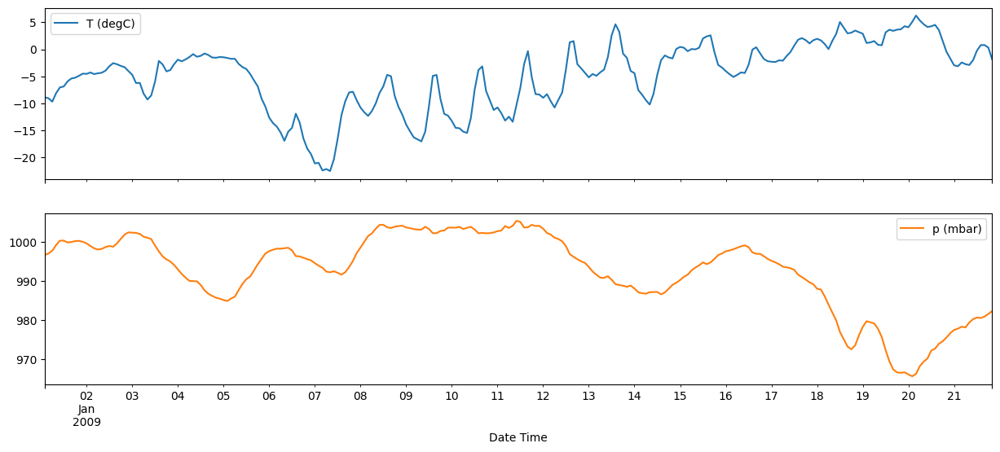

In [32]:
# let's plot the data
plot_cols = ['T (degC)', 'p (mbar)']
plot_features = df[plot_cols] [:250]
plot_features.index = date_time [:250]
plot_features.plot(subplots=True)

array([<Axes: xlabel='Date Time'>, <Axes: xlabel='Date Time'>],
      dtype=object)

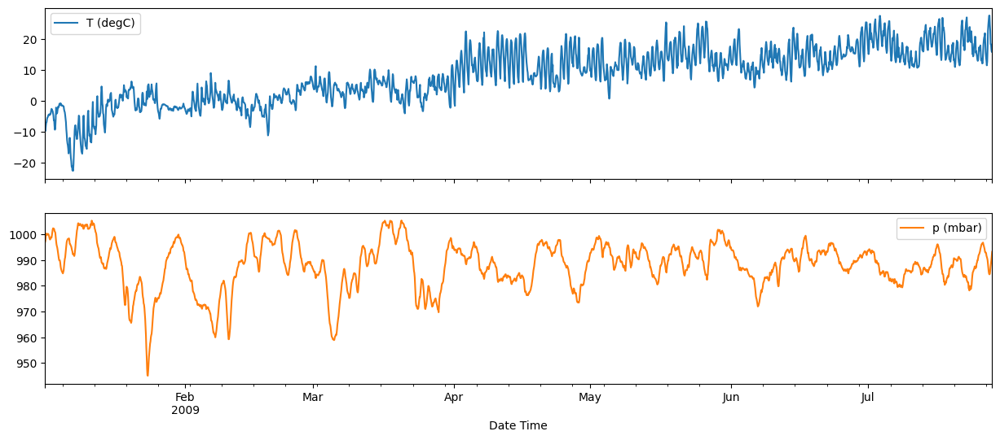

In [33]:
# let's plot the data
plot_cols = ['T (degC)', 'p (mbar)']
plot_features = df[plot_cols] [:2500]
plot_features.index = date_time [:2500]
plot_features.plot(subplots=True)

array([<Axes: xlabel='Date Time'>, <Axes: xlabel='Date Time'>],
      dtype=object)

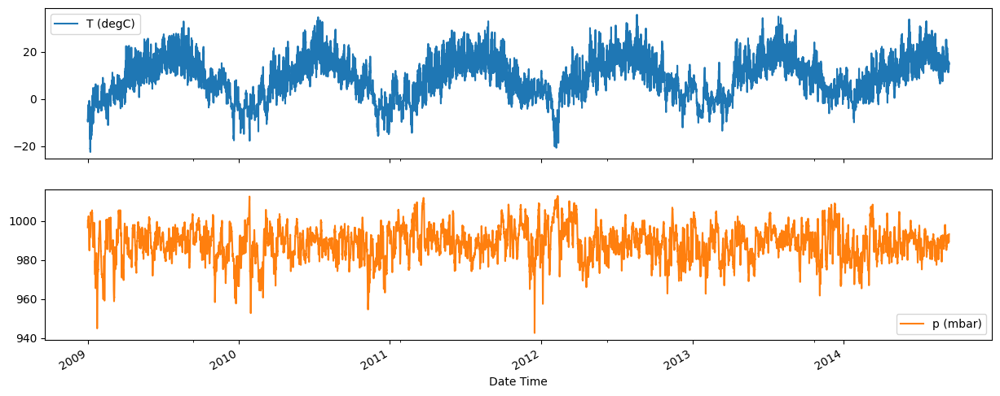

In [34]:
# let's plot the data
plot_cols = ['T (degC)', 'p (mbar)']
plot_features = df[plot_cols] [:25000]
plot_features.index = date_time [:25000]
plot_features.plot(subplots=True)

array([<Axes: xlabel='Date Time'>, <Axes: xlabel='Date Time'>],
      dtype=object)

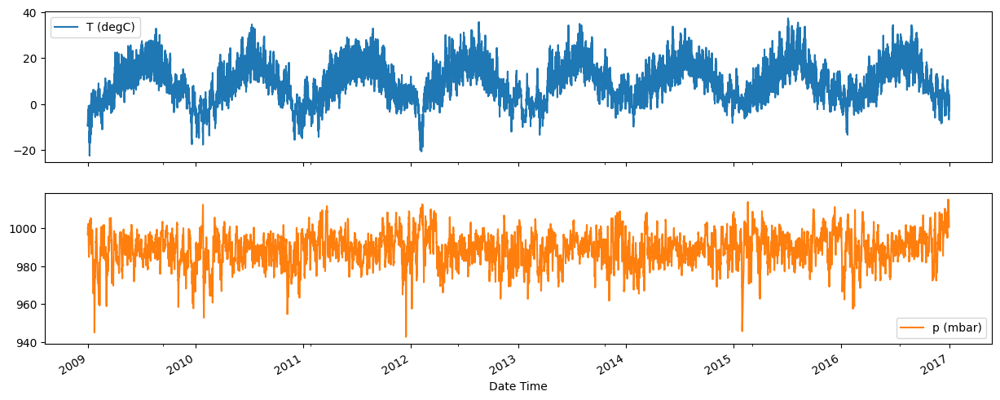

In [35]:
# let's plot the data
plot_cols = ['T (degC)', 'p (mbar)']
plot_features = df[plot_cols] [:250000]
plot_features.index = date_time [:250000]
plot_features.plot(subplots=True)

array([<Axes: xlabel='Date Time'>, <Axes: xlabel='Date Time'>],
      dtype=object)

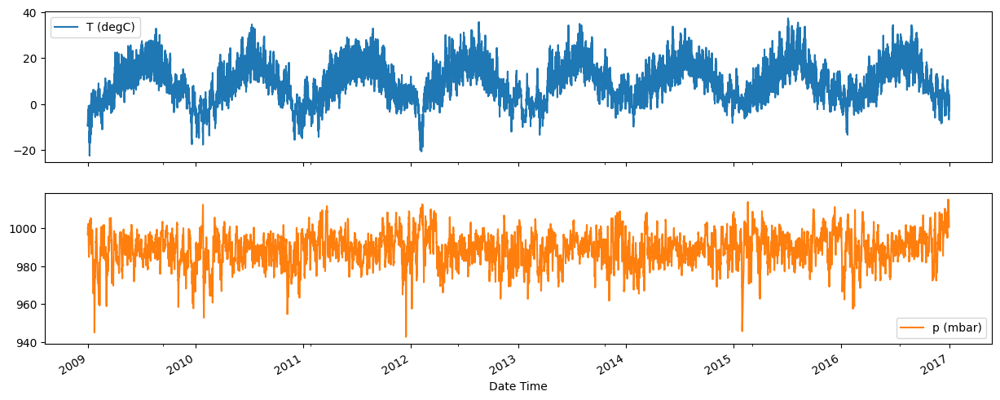

In [36]:
# let's plot the data
plot_cols = ['T (degC)', 'p (mbar)']
plot_features = df[plot_cols] [:2500000]
plot_features.index = date_time [:2500000]
plot_features.plot(subplots=True)

array([<Axes: xlabel='Date Time'>, <Axes: xlabel='Date Time'>],
      dtype=object)

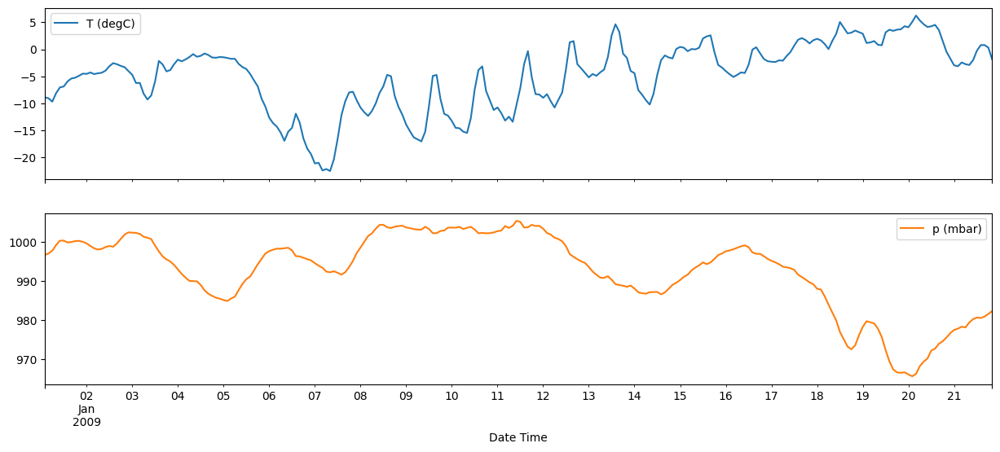

In [37]:
# let's plot only the first 500 hours dataset which is equal to 250 records
# let's plot the data
plot_cols = ['T (degC)', 'p (mbar)']
plot_features = df[plot_cols] [:250]
plot_features.index = date_time [:250]
plot_features.plot(subplots=True)

In [45]:
# clean up the data
# lets check if there are any null values in the dataset
df.isnull().sum()

p (mbar)           0
T (degC)           0
Tpot (K)           0
Tdew (degC)        0
rh (%)             0
VPmax (mbar)       0
VPact (mbar)       0
VPdef (mbar)       0
sh (g/kg)          0
H2OC (mmol/mol)    0
rho (g/m**3)       0
wv (m/s)           0
max. wv (m/s)      0
wd (deg)           0
dtype: int64

In [46]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
p (mbar),35045.0,989.213079,8.353850,942.65,984.20,989.57,994.72,1015.16
T (degC),35045.0,9.450335,8.425301,-22.50,3.36,9.43,15.49,37.28
Tpot (K),35045.0,283.492908,8.506133,251.22,277.44,283.48,289.55,311.21
Tdew (degC),35045.0,4.955012,6.729168,-24.55,0.24,5.22,10.08,22.19
rh (%),35045.0,76.006020,16.483440,13.88,65.15,79.30,89.50,100.00
VPmax (mbar),35045.0,13.577314,7.743076,0.99,7.77,11.83,17.62,63.77
VPact (mbar),35045.0,9.532714,4.181965,0.83,6.22,8.86,12.36,26.79
VPdef (mbar),35045.0,4.044542,4.902793,0.00,0.87,2.18,5.30,46.01
sh (g/kg),35045.0,6.021744,2.654692,0.52,3.92,5.60,7.81,17.13
H2OC (mmol/mol),35045.0,9.639148,4.233082,0.83,6.29,8.97,12.49,27.25


In [49]:
wv = df['wv (m/s)']
bad_wv = WV == -9999.0
wv[bad_wv] = 0.0

In [53]:
max_wv = df ['max. wv (m/s)']
bad_max_wv = max_wv == -9999.0
max_wv [bad_max_wv] = 0.0

In [54]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
p (mbar),35045.0,989.213079,8.353850,942.65,984.20,989.57,994.72,1015.16
T (degC),35045.0,9.450335,8.425301,-22.50,3.36,9.43,15.49,37.28
Tpot (K),35045.0,283.492908,8.506133,251.22,277.44,283.48,289.55,311.21
Tdew (degC),35045.0,4.955012,6.729168,-24.55,0.24,5.22,10.08,22.19
rh (%),35045.0,76.006020,16.483440,13.88,65.15,79.30,89.50,100.00
VPmax (mbar),35045.0,13.577314,7.743076,0.99,7.77,11.83,17.62,63.77
VPact (mbar),35045.0,9.532714,4.181965,0.83,6.22,8.86,12.36,26.79
VPdef (mbar),35045.0,4.044542,4.902793,0.00,0.87,2.18,5.30,46.01
sh (g/kg),35045.0,6.021744,2.654692,0.52,3.92,5.60,7.81,17.13
H2OC (mmol/mol),35045.0,9.639148,4.233082,0.83,6.29,8.97,12.49,27.25


In [55]:
df.shape

(35045, 14)

In [56]:
#split the data into train, validation and test i have 35045 records make 70%, 20% for validation and 10% for testing
# 70% of 35045 is 24531
# 20% of 35045 is 7009
# 10% of 35045 is 3505
# total 35045
# train data
train_df = df [:24531]
# validation data
val_df = df [24531:31540]
# test data
test_df = df [31540:]

#lets check the shape of the data
train_df.shape, val_df.shape, test_df.shape


((24531, 14), (7009, 14), (3505, 14))

array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >], dtype=object)

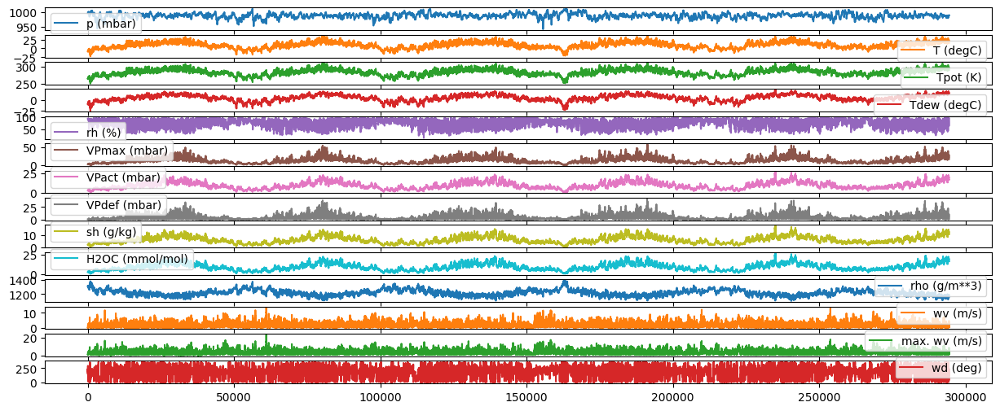

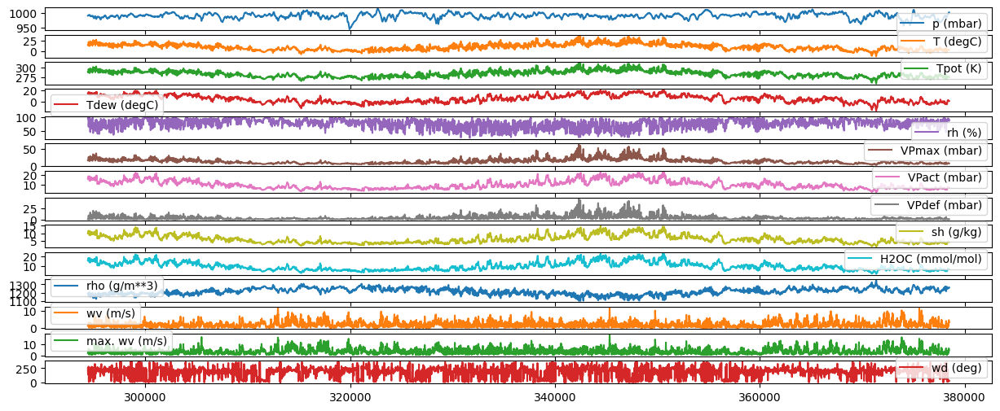

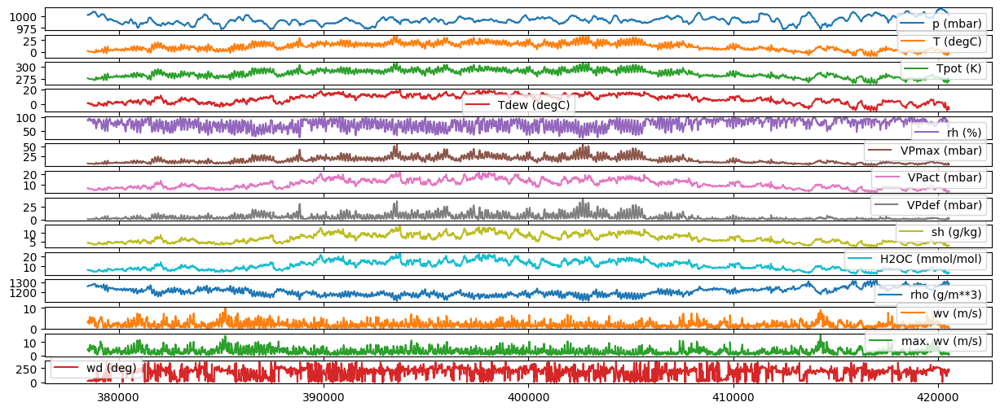

In [57]:
# lets plot the data 
train_df.plot(subplots=True)

# lets plot the data 
val_df.plot(subplots=True)

# lets plot the data 
test_df.plot(subplots=True)

In [58]:
# lets normalize the data
# we will use the mean and standard deviation of the training data to normalize the data
train_mean = train_df.mean()
train_std = train_df.std()

#lets normalize the training data
train_df = (train_df - train_mean) / train_std
#lets normalize the validation data
val_df = (val_df - train_mean) / train_std
# lets normalize the test data
test_df = (test_df - train_mean) / train_std


array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >], dtype=object)

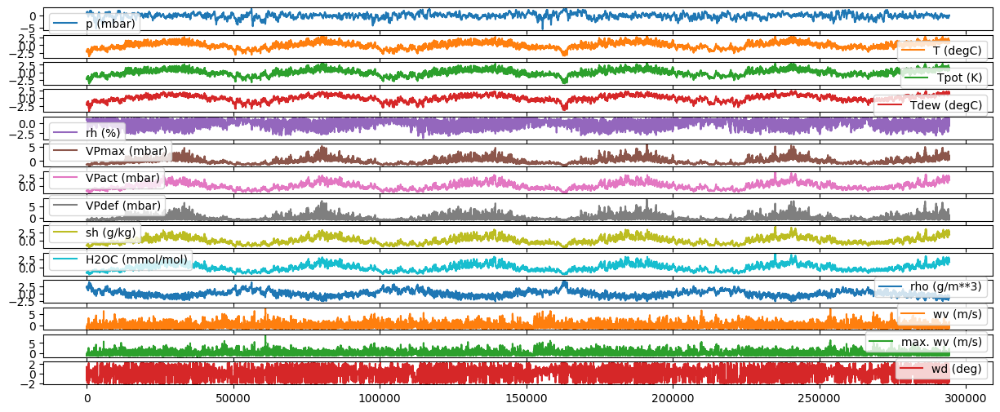

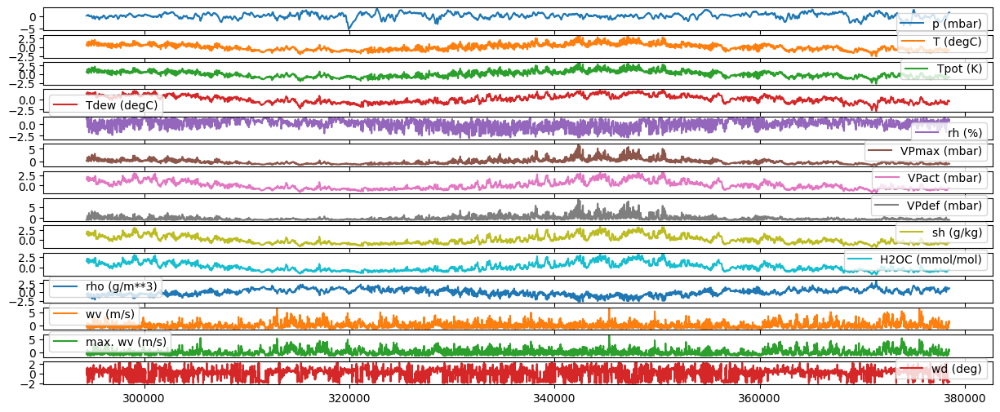

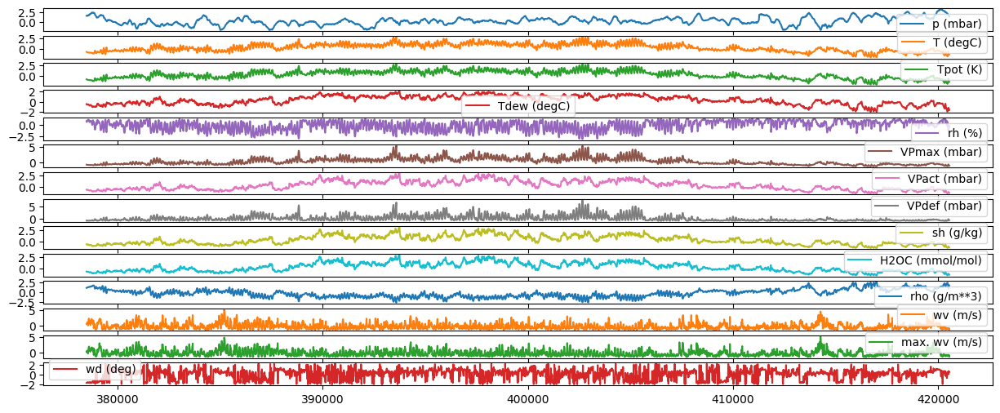

In [59]:
# lets plot the data 
train_df.plot(subplots=True)

# lets plot the data 
val_df.plot(subplots=True)

# lets plot the data 
test_df.plot(subplots=True)

In [ ]:
# we will use the windowed dataset to train the model
# we will use the windowed dataset to validate the model
# we will use the windowed dataset to test the model
# we will use the windowed dataset to predict the model
# we will use the windowed dataset to plot the model

In [ ]:
                                                                              "THANKYOU"                                